## Introduction
This work is inspired by the research paper [Jukebox: A Generative Model for Music](https://cdn.openai.com/papers/jukebox.pdf). In this notebook, I have developed a generative model that could generate music from a variational autoencoder trained with a category of music. I have selected the jazz and classical music categories. The entire model is implemented in TensorFlow and used Librosa for audio processing. The input sampling rate is 3000 for processing the audio file into a readable array.

In [35]:
# ! deactivate
# ! source /Users/ptraver/Desktop/devel/MIR/Final_Project/.venv/bin/activate
# !pip install tensorflow-addons
# !pip install --upgrade --ignore-installed tensorflow
# !pip install -q imageio
# !pip install -q git+https://github.com/tensorflow/docs
# ! pip install librosa
# ! pip install pandas
# ! pip uninstall numpy -y
# ! pip install numpy==1.24
# ! pip install os
# ! pip install matplotlib==3.7
# ! pip install IPython
# ! pip install glob
# ! pip install imageio
# ! pip install time

In [36]:
import librosa

import numpy as np
import pandas as pd
import os

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import layers 
tf.config.run_functions_eagerly(True)

import matplotlib.pyplot as plt
from IPython import display
from IPython.display import clear_output
from tqdm import tqdm

import glob
import imageio
import time
import IPython.display as ipd
import soundfile as sf

AUTOTUNE = tf.data.experimental.AUTOTUNE
np.version.version

'1.24.0'

In [37]:
seed=123
tf.compat.v1.set_random_seed(seed)
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

In [38]:
train_size = 60000
BATCH_SIZE = 10
test_size = 10000
epochs = 5
# set the dimensionality of the latent space to a plane for visualization later
latent_dim = 2
num_examples_to_generate = 10
sr = 22050
length = 29

BASE_PATH = '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original'
GENERATED_PATH = '/Users/ptraver/Desktop/devel/MIR/Final_Project/generated_audio/'

## Data preprocessing

In [39]:
def DatasetLoader(class_):
    music_list = np.array(sorted(os.listdir(BASE_PATH+'/'+class_)))
    train_music_1 = list(music_list[[0,19,39,71,12,75,85,3,45,24,46,88]]) #99,10,66,76,41
    train_music_2 = list(music_list[[4,43,56,55,45,31,11,13,70,37,21,78]]) #65,32,53,22,19,80,89,
    TrackSet_1 = [(BASE_PATH)+'/'+class_+'/%s'%(x) for x in train_music_1]
    TrackSet_2 = [(BASE_PATH)+'/'+class_+'/%s'%(x) for x in train_music_2]

    return TrackSet_1, TrackSet_2

In [40]:
def DatasetLoaderMulticlass():
    TrackSet_1 = []
    TrackSet_2 = []
    for class_ in os.listdir(BASE_PATH):
        if class_.startswith('.'):
            continue
        music_list = np.array(sorted(os.listdir(BASE_PATH+'/'+class_))).flatten()
        TrackSet_1 += [(BASE_PATH)+'/'+class_+'/%s'%(x) for x in music_list[0:50]]
        TrackSet_2 += [(BASE_PATH)+'/'+class_+'/%s'%(x) for x in music_list[50:100]]

    return TrackSet_1, TrackSet_2

In [41]:
def load(file_):
    data_, sampling_rate = librosa.load(file_,sr=sr, offset=0.0, duration=length)
    data_ = data_.reshape(1,sr*length)
    return data_
map_data = lambda filename: tf.compat.v1.py_func(load, [filename], [tf.float32])

In [42]:
TrackSet_1, TrackSet_2 = DatasetLoader('jazz')
print(TrackSet_1)

['/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00000.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00019.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00039.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00072.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00012.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00076.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00086.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00003.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00045.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/jazz/jazz.00024.wav', '/Users/ptraver/Desktop/devel

In [43]:
TrackMultiSet_1, TrackMultiSet_2 = DatasetLoaderMulticlass()
print(TrackMultiSet_1)

['/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00000.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00001.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00002.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00003.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00004.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00005.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00006.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00007.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00008.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/gtzan-data/genres_original/pop/pop.00009.wav', '/Users/ptraver/Desktop/devel/MIR/Final_Project/g

## sample original music

In [44]:
sample = TrackSet_1[1]
sample_, sampling_rate = librosa.load(sample, sr=sr)
ipd.Audio(sample_,rate=sr)

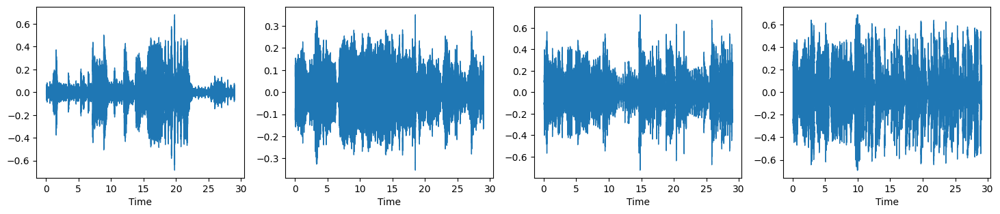

In [45]:
import librosa.display
plt.figure(figsize=(18,15))
for i in range(4):
    plt.subplot(4, 4, i + 1)
    j = load(TrackSet_1[i])
    librosa.display.waveshow(j[0], sr=sr)
    

In [46]:
GLOBAL_TRAIN_1 = TrackMultiSet_1 # TrackSet_1 or TrackMultiSet_1
GLOBAL_TRAIN_2 = TrackMultiSet_2 # TrackSet_2 or TrackMultiSet_2

train_dataset = (
    tf.data.Dataset
    .from_tensor_slices((GLOBAL_TRAIN_1))
    .map(map_data, num_parallel_calls=AUTOTUNE)
    .shuffle(3)
    .batch(BATCH_SIZE)
)
test_dataset = (
    tf.data.Dataset
    .from_tensor_slices((GLOBAL_TRAIN_2))
    .map(map_data, num_parallel_calls=AUTOTUNE)
    .shuffle(3)
    .batch(BATCH_SIZE)
)

In [47]:
# FREQ_TRAIN_1 = TrackSet_1 # TrackSet_1 or TrackMultiSet_1
# FREQ_TRAIN_2 = TrackSet_2 # TrackSet_2 or TrackMultiSet_2

# # Assuming compute_mel_spectrogram is a function that takes a filename and returns a mel spectrogram
# def compute_mel_spectrogram(filename):
#     # Your mel spectrogram computation logic here (replace with your actual implementation)
#     mel_spectrogram = np.random.rand(128, 128).astype(np.float32)
#     return mel_spectrogram

# def map_data(filename):
#     # Use tf.py_function to wrap the non-TensorFlow function
#     mel_spectrogram = tf.py_function(compute_mel_spectrogram, [filename], tf.float32)
    
#     # Perform any additional preprocessing if needed
    
#     # Convert to TensorFlow tensor
#     mel_spectrogram = tf.convert_to_tensor(mel_spectrogram, dtype=tf.float32)

#     # Normalize if needed (example normalization)
#     mel_spectrogram = mel_spectrogram / tf.reduce_max(mel_spectrogram)

#     return mel_spectrogram

# # Example usage in creating a dataset
# freq_train_dataset = tf.data.Dataset.from_tensor_slices(FREQ_TRAIN_1)
# freq_train_dataset = freq_train_dataset.map(map_data, num_parallel_calls=tf.data.AUTOTUNE)

# freq_test_dataset = tf.data.Dataset.from_tensor_slices(FREQ_TRAIN_2)
# freq_test_dataset = freq_train_dataset.map(map_data, num_parallel_calls=tf.data.AUTOTUNE)

# The rest of your pipeline (shuffle, batch, repeat, etc.) can be applied as needed


# train_dataset = (
#     tf.data.Dataset
#     .from_tensor_slices((FREQ_TRAIN_1))
#     .map(map_data, num_parallel_calls=AUTOTUNE)
#     .shuffle(3)
#     .batch(BATCH_SIZE)
# )
# test_dataset = (
#     tf.data.Dataset
#     .from_tensor_slices((FREQ_TRAIN_2))
#     .map(map_data, num_parallel_calls=AUTOTUNE)
#     .shuffle(3)
#     .batch(BATCH_SIZE)
# )

## Explaining the concept

## Encoder network
This defines the approximate posterior distribution *q(z|x)*, which takes as input an observation and outputs a set of parameters for specifying the conditional distribution of the latent representation *z*. In this example, we simply model the distribution as a diagonal Gaussian, and the network outputs the mean and log-variance parameters of a factorized Gaussian. We output log-variance instead of the variance directly for numerical stability.
## Decoder network
This defines the conditional distribution of the observation *p(x|z)*, which takes a latent sample *z* as input and outputs the parameters for a conditional distribution of the observation. We model the latent distribution prior *p(z)* as a unit Gaussian.
## Reparameterization
To generate a sample *z* for the decoder during training, we can sample from the latent distribution defined by the parameters outputted by the encoder, given an input observation *x*. However, this sampling operation creates a bottleneck because backpropagation cannot flow through a random node.

To address this, we use a reparameterization trick. In our example, we approximate *z* using the decoder parameters and another parameter *ϵ* as follows:

z = μ + σ.ϵ

Source: [Tensorflow](https://www.tensorflow.org/tutorials/generative/cvae)

## Network architecture

In [48]:
class Resnet1DBlock(tf.keras.Model):
    def __init__(self, kernel_size, filters,type='encode'):
        super(Resnet1DBlock, self).__init__()
    
        if type=='encode':
            self.conv1a = layers.Conv1D(filters, kernel_size, 2,padding="same")
            self.conv1b = layers.Conv1D(filters, kernel_size, 1,padding="same")
            self.norm1a = tfa.layers.InstanceNormalization()
            self.norm1b = tfa.layers.InstanceNormalization()
        if type=='decode':
            self.conv1a = layers.Conv1DTranspose(filters, kernel_size, 1,padding="same")
            self.conv1b = layers.Conv1DTranspose(filters, kernel_size, 1,padding="same")
            self.norm1a = tf.keras.layers.BatchNormalization()
            self.norm1b = tf.keras.layers.BatchNormalization()
        else:
            return None

    def call(self, input_tensor):
        x = tf.nn.relu(input_tensor)
        x = self.conv1a(x)
        x = self.norm1a(x)
        x = layers.LeakyReLU(0.4)(x)

        x = self.conv1b(x)
        x = self.norm1b(x)
        x = layers.LeakyReLU(0.4)(x)

        x += input_tensor
        return tf.nn.relu(x)


In [49]:
class CVAE(tf.keras.Model):
    """Convolutional variational autoencoder."""

    def __init__(self, latent_dim):
        super(CVAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(1,sr*length), name = '1'),
                layers.Conv1D(512,1,2, name = '2'),
                Resnet1DBlock(512,1),
                layers.Conv1D(256,1,2, name = '3'),
                Resnet1DBlock(256,1),
                layers.Conv1D(128,1,2, name = '4'),
                Resnet1DBlock(128,1),
                layers.Conv1D(64,1,2, name = '5'),
                Resnet1DBlock(64,1),
                # No activation
                layers.Flatten(name = '6'),
                layers.Dense(latent_dim+latent_dim, name = '7')

            ], name = 'seq1'
        )
        self.decoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
                layers.Reshape(target_shape=(1,latent_dim)),
                Resnet1DBlock(64,1,'decode'),
                layers.Conv1DTranspose(512,1,1),
                Resnet1DBlock(128,1,'decode'),
                layers.Conv1DTranspose(256,1,1),
                Resnet1DBlock(256,1,'decode'),
                layers.Conv1DTranspose(128,1,1),
                Resnet1DBlock(512,1,'decode'),
                layers.Conv1DTranspose(512,1,1),
                # No activation
                layers.Conv1DTranspose(sr*length,1,1),
            ],
        )
    @tf.function
    def sample(self, eps=None):
        if eps is None:
            eps = tf.random.normal(shape=(200, self.latent_dim))
        return self.decode(eps, apply_sigmoid=True)
    @tf.function
    def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar
    @tf.function
    def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * .5) + mean
    @tf.function
    def decode(self, z, apply_sigmoid=False):
        logits = self.decoder(z)
        if apply_sigmoid:
            probs = tf.sigmoid(logits)
            return probs
        return logits

In [50]:
optimizer = tf.keras.optimizers.legacy.Adam(0.0003,beta_1=0.9, beta_2=0.999,epsilon=1e-08)

In [51]:
@tf.function
def log_normal_pdf(sample, mean, logvar, raxis=1):
    log2pi = tf.math.log(2. * np.pi)
    return tf.reduce_sum(
         -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
          axis=raxis)

In [52]:
@tf.function
def compute_loss(model, x):
    mean, logvar = model.encode(x)
    z = model.reparameterize(mean, logvar)
    x_logit = model.decode(z)
    cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
    logpx_z = -tf.reduce_sum(cross_ent, axis=[1,2])
    logpz = log_normal_pdf(z, 0., 0.)
    logqz_x = log_normal_pdf(z, mean, logvar)
    return -tf.reduce_mean(logpx_z + logpz - logqz_x)

## Loss Optimization
Here we have optimized two lossess, the **KL loss** and **reconstruction loss**.<br>

## KL Loss

The KL divergence tells us how well the probability distribution Q approximates the probability distribution P by calculating the cross-entropy minus the entropy. Intuitively, you can think of that as the statistical measure of how one distribution differs from another.
In VAE, let X be the data we want to model, z be latent variable, P(X) be the probability distribution of data, P(z) be the probability distribution of the latent variable and P(X|z) be the distribution of generating data given latent variable.

In the case of variational autoencoders, our objective is to infer P(z)
from P(z|X). P(z|X) is the probability distribution that projects our data into latent space. But since we do not have the distribution P(z|X), we estimate it using its simpler estimation Q.

Now while training our VAE, the encoder should try to learn the simpler distribution Q(z|X)
such that it is as close as possible to the actual distribution P(z|X). This is where we use KL divergence as a measure of a difference between two probability distributions. The VAE objective function thus includes this KL divergence term that needs to be minimized.

*DKL[Q(z|X)||P(z|X)] = E[ logQ(z|X) − logP(z|X) ]*

## Reconstruction loss
As the name suggest, it measures the reconstruction of original input x. This network can be trained by minimizing the reconstruction error, which measures the differences between our original input and the consequent reconstruction.

In [53]:
@tf.function
def train_step(model, x, optimizer):
    
    """Executes one training step and returns the loss.

       This function computes the loss and gradients, and uses the latter to
       update the model's parameters.
     """
    with tf.GradientTape() as tape:
            mean, logvar = model.encode(x)
            z = model.reparameterize(mean, logvar)
            x_logit = model.decode(z)
            cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
            logpx_z = -tf.reduce_sum(cross_ent, axis=[1,2])
            logpz = log_normal_pdf(z, 0., 0.)
            logqz_x = log_normal_pdf(z, mean, logvar)
            loss_KL = -tf.reduce_mean(logpx_z + logpz - logqz_x)
            reconstruction_loss = tf.reduce_mean(
                     tf.keras.losses.binary_crossentropy(x, x_logit)
                 )
            total_loss = reconstruction_loss+ loss_KL
    gradients = tape.gradient(total_loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [54]:
# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(
    shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim)

In [55]:
import librosa.display

def generate_and_save_images(model, epoch, test_sample, save):
    mean, logvar = model.encode(test_sample)
    plt.scatter(mean[:,0], mean[:,1])
    z = model.reparameterize(mean, logvar)
    predictions = model.sample(z)
    # fig = plt.figure(figsize=(12, 10))

    # for i in range(predictions.shape[0]):
    #     plt.subplot(4, 4, i + 1)
    #     wave = np.asarray(predictions[i])
    #     librosa.display.waveshow(wave[0], sr=sr)

    # # tight_layout minimizes the overlap between 2 sub-plots
    # plt.savefig('kaggle_images/{}_{:04d}.png'.format(save, epoch))
    # plt.savefig('kaggle_images/{}_{:04d}.png'.format(save, epoch))
    # plt.show()

In [56]:
# Pick a sample of the test set for generating output images
assert BATCH_SIZE >= num_examples_to_generate
for test_batch in test_dataset.take(1):
    test_sample = test_batch[0]

## Training the model

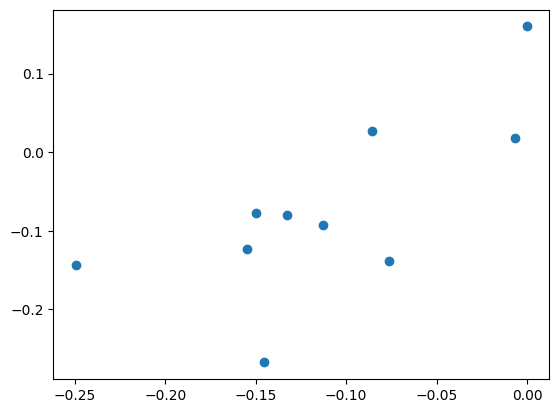

In [57]:
generate_and_save_images(model, 0, test_sample, 'jazz')
def train(train_dataset, test_dataset, model, save):
    for epoch in range(1, epochs + 1):
        start_time = time.time()
        for train_x in tqdm(train_dataset, desc='Training'):
            train_x = np.asarray(train_x)[0]
            train_step(model, train_x, optimizer)
        end_time = time.time()

        loss = tf.keras.metrics.Mean()
        for test_x in tqdm(test_dataset, desc='Testing'):
            test_x = np.asarray(test_x)[0]
            loss(compute_loss(model, test_x))
        display.clear_output(wait=False)
        # It seems like the loss is taking a long time now (larger dimensions at the beginning?)
        elbo = -loss.result()
        print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'.format(epoch, 
                                                                                       elbo, 
                                                                                       end_time - start_time
                                                                                      ))
        generate_and_save_images(model,
                                 epoch, 
                                 test_sample,
                                 save)


Epoch: 5, Test set ELBO: nan, time elapse for current epoch: 593.8964219093323


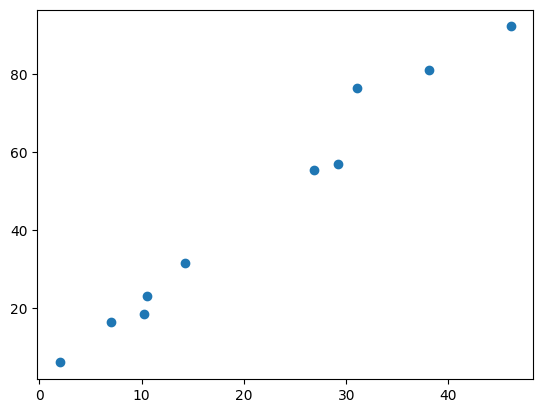

In [58]:
train(train_dataset, test_dataset, model, 'jazz')

In [69]:
anim_file_1 = 'jazz_cvae.gif'

with imageio.get_writer(anim_file_1, mode='I') as writer:
    filenames = glob.glob('kaggle_images/jazz*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

/var/folders/vl/bdk3_hrx55x8mtjnvmdg4n6w0000gn/T/ipykernel_15449/2840335566.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/var/folders/vl/bdk3_hrx55x8mtjnvmdg4n6w0000gn/T/ipykernel_15449/2840335566.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


## Visualization


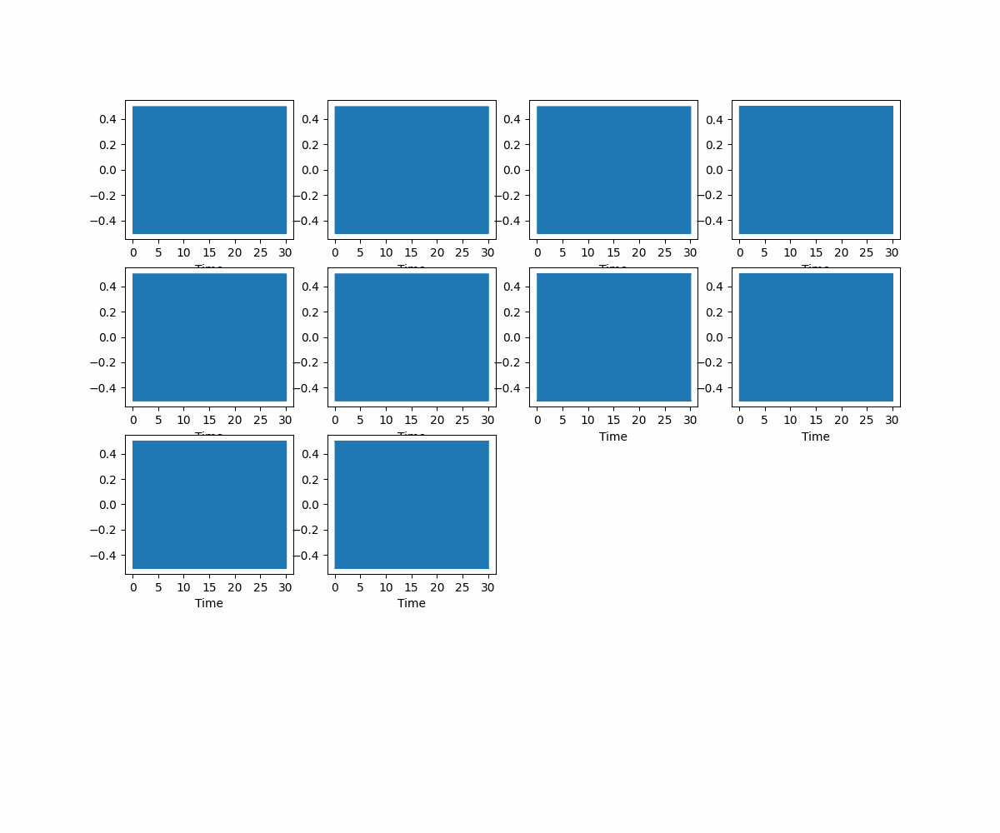

In [70]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file_1)

## Generated Music - Jazz
Let us listen to the music generated by our model, trained only with jazz music.

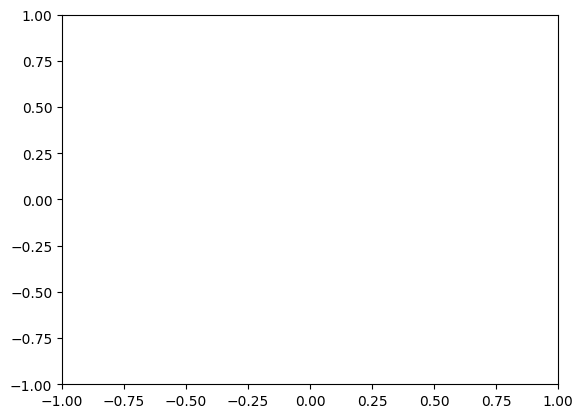

In [71]:
def inference(test_dataset, model):  
    save_music = []
    for test in test_dataset:
        mean, logvar = model.encode(test)
        plt.scatter(mean[:,0], mean[:,1])
        #print('mean' +str(mean), 'logvar' + str(logvar))
        z = model.reparameterize(mean, logvar)
        predictions = model.sample(z)
        for pred in predictions:
            wave = np.asarray(pred)
            save_music.append(wave)
    return save_music
plt.xlim(-1,1)
plt.ylim(-1,1)
saved_musics = inference(test_dataset, model)

In [62]:
music1=saved_musics[0][0]
ipd.Audio(music1,rate=sr)

In [63]:
music2=saved_musics[9][0]
ipd.Audio(music2,rate=sr)

In [64]:
music3=saved_musics[5][0]
ipd.Audio(music3,rate=sr)

In [65]:
music4=saved_musics[10][0]
ipd.Audio(music4,rate=sr)

In [66]:
music5=saved_musics[8][0]
ipd.Audio(music5,rate=sr)

In [67]:
music6=saved_musics[7][0]
ipd.Audio(music6,rate=sr)

In [68]:
print(np.shape(saved_musics))
print(sr)
counter = 0
for audio in np.array(saved_musics).reshape(12, 661500):
    sf.write(GENERATED_PATH + 'generated' + str(counter) + '.wav', audio, sr)
    counter += 1

music_list = np.array(sorted(os.listdir(GENERATED_PATH)))
pre_tensors_generated = [(GENERATED_PATH)+'%s'%(x) for x in music_list]
print(pre_tensors_generated)


(499, 1, 639450)
22050


ValueError: cannot reshape array of size 319085550 into shape (12,661500)

# Evaluation & Analysis

In [ ]:
# Define function for KL Divergence between multivariate gaussians   
def multivariate_kl_divergence(mean1, log_var1, mean2, log_var2):
    """
    Compute the multivariate KL divergence between two Gaussian distributions.

    Parameters:
    - mean1: Mean vector for the first distribution
    - log_var1: Log-variance vector for the first distribution
    - mean2: Mean vector for the second distribution
    - log_var2: Log-variance vector for the second distribution

    Returns:
    - kl_divergence: Multivariate KL divergence
    """

    # Ensure the input vectors have the same length
    assert len(mean1) == len(log_var1) == len(mean2) == len(log_var2), "Input vectors must have the same length"

    # Dimensionality of the latent space
    latent_dim = len(mean1)

    # Calculate the covariance matrices
    cov_matrix1 = np.diag(np.exp(log_var1))
    cov_matrix2 = np.diag(np.exp(log_var2))

    # Calculate the inverse and determinant of the covariance matrices
    inv_cov_matrix1 = np.linalg.inv(cov_matrix1)
    inv_cov_matrix2 = np.linalg.inv(cov_matrix2)
    det_cov_matrix1 = np.linalg.det(cov_matrix1)
    det_cov_matrix2 = np.linalg.det(cov_matrix2)

    # Calculate the mean difference
    mean_diff = mean2 - mean1

    # Calculate the trace term
    trace_term = np.trace(np.matmul(inv_cov_matrix2, cov_matrix1))

    # Calculate the quadratic term
    quad_term = np.matmul(np.matmul(mean_diff.T, np.linalg.inv(cov_matrix2)), mean_diff)

    # Calculate the logarithmic term
    log_term = np.log(det_cov_matrix2 / det_cov_matrix1)

    # Calculate the final KL divergence
    kl_divergence = 0.5 * (trace_term + quad_term - latent_dim + log_term)

    return kl_divergence

/Users/ptraver/Desktop/devel/MIR/Final_Project/.venv/lib/python3.11/site-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


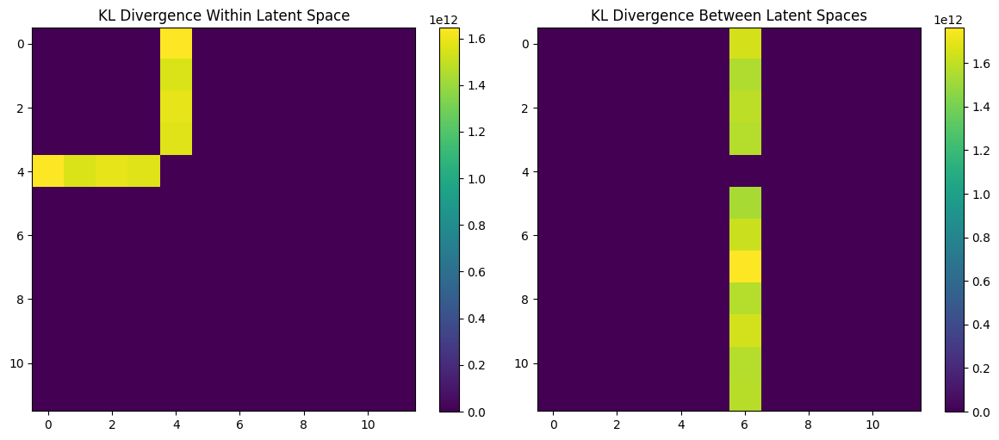

In [ ]:
#Get KL Divergence of generated samples against input samples
counter = 0
for audio in np.array(saved_musics).reshape(12, 661500):
    sf.write(GENERATED_PATH + 'generated' + str(counter) + '.wav', audio, sr)
    counter += 1

music_list = np.array(sorted(os.listdir(GENERATED_PATH)))
pre_tensors_generated = [(GENERATED_PATH)+'%s'%(x) for x in music_list]

generated_tensors = (
    tf.data.Dataset
    .from_tensor_slices((pre_tensors_generated))
    .map(map_data, num_parallel_calls=AUTOTUNE)
    .shuffle(3)
    .batch(BATCH_SIZE)
)

input_mean = np.empty([0,2])
input_logvar = np.empty([0,2])
for audio in test_dataset:
    mean, logvar = model.encode(audio)
    input_mean = np.concatenate((mean.numpy(), input_mean))
    input_logvar = np.concatenate((logvar.numpy(), input_logvar))
    
generated_mean = np.empty([0,2])
generated_logvar = np.empty([0,2])
for audio in test_dataset:
    mean, logvar = model.encode(audio)
    generated_mean = np.concatenate((mean.numpy(), generated_mean))
    generated_logvar = np.concatenate((logvar.numpy(), generated_logvar))

# Function to compute KL divergence matrix for pairs within a latent space
def compute_kl_matrix(latent_means, latent_log_vars):
    num_samples = len(latent_means)
    kl_matrix = np.zeros((num_samples, num_samples))

    for i in range(num_samples):
        for j in range(i + 1, num_samples):
            kl_divergence = multivariate_kl_divergence(latent_means[i], latent_log_vars[i],
                                                       latent_means[j], latent_log_vars[j])
            kl_matrix[i, j] = kl_divergence
            kl_matrix[j, i] = kl_divergence

    return kl_matrix

# Function to compute KL divergence matrix between two latent spaces
def compute_cross_kl_matrix(latent_means1, latent_log_vars1, latent_means2, latent_log_vars2):
    num_samples1 = len(latent_means1)
    num_samples2 = len(latent_means2)
    cross_kl_matrix = np.zeros((num_samples1, num_samples2))

    for i in range(num_samples1):
        for j in range(num_samples2):
            kl_divergence = multivariate_kl_divergence(latent_means1[i], latent_log_vars1[i],
                                                       latent_means2[j], latent_log_vars2[j])
            cross_kl_matrix[i, j] = kl_divergence

    return cross_kl_matrix

# Example usage:
# Assuming you have two latent spaces represented by latent_means1, latent_log_vars1
# and latent_means2, latent_log_vars2

# Compute KL divergence matrices
kl_matrix_within = compute_kl_matrix(input_mean, input_logvar)
kl_matrix_cross = compute_cross_kl_matrix(input_mean, input_logvar, generated_mean, generated_logvar)

# Plotting the similarity matrices
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(kl_matrix_within, cmap='viridis', origin='upper', interpolation='nearest')
plt.title('KL Divergence Within Latent Space')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(kl_matrix_cross, cmap='viridis', origin='upper', interpolation='nearest')
plt.title('KL Divergence Between Latent Spaces')
plt.colorbar()

plt.tight_layout()
plt.show()

In [ ]:
# Cross correlation distance metrics
from scipy.signal import correlate

generated = np.array(saved_musics).reshape(12, 661500)
originals = np.array([librosa.load(audio)[0][:661500] for audio in GLOBAL_TRAIN_2])

print(np.shape(correlate(generated[0], originals[0])))

correlation_matrix = np.empty((12,12))
for i in range(len(generated)):
    for j in range(len(originals)):
        correlation_matrix[i,j] = correlate(generated[i], originals[j])

(1322999,)


ValueError: setting an array element with a sequence.

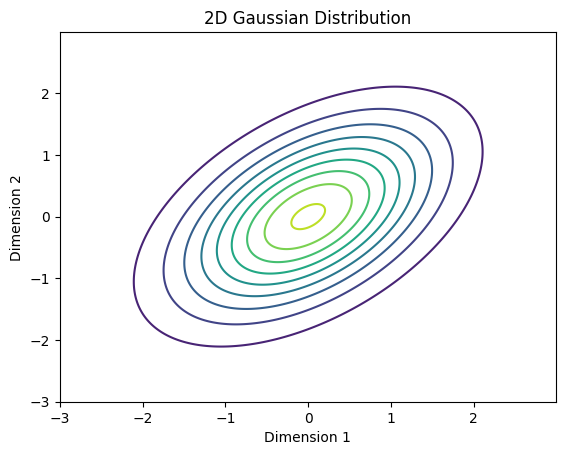

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

# Example mean and covariance matrix
mean = np.array([0.0, 0.0])
covariance_matrix = np.array([[1.0, 0.5], [0.5, 1.0]])

# Create a grid of points
x, y = np.mgrid[-3:3:.01, -3:3:.01]
pos = np.dstack((x, y))

# Create a multivariate normal distribution
gaussian_distribution = multivariate_normal(mean, covariance_matrix)

# Evaluate the PDF at each point in the grid
pdf_values = gaussian_distribution.pdf(pos)

# Plot the contour plot
plt.contour(x, y, pdf_values, levels=10, cmap='viridis')
plt.title('2D Gaussian Distribution')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()


In [ ]:
import numpy as np

def sample_latent_variables(mean, log_var):
    epsilon = np.random.normal(size=mean.shape)
    return mean + np.exp(0.5 * log_var) * epsilon

# Example: assuming you have mean and log_var from your VAE encoder
latent_mean = np.array([0.0, 0.0])  # Replace with your actual values
latent_log_var = np.array([0.0, 0.0])  # Replace with your actual values

# Sample latent variables
latent_sample = sample_latent_variables(latent_mean, latent_log_var)

print("Sampled Latent Variables:", latent_sample)

Sampled Latent Variables: [ 1.05553566 -0.14983835]
